# Data


In [1]:
import os
import pandas as pd
df_pairs = pd.read_csv("/kaggle/input/coco-gray-color/pairs.csv")
df_pairs = df_pairs.iloc[:50000]
df_pairs.drop(columns=['Unnamed: 0'], inplace=True)
df_pairs

,gray_path,color_path
0,/kaggle/input/img-gray-coco/img_gray/000000276...,/kaggle/input/coco-2017-dataset/coco2017/train...
1,/kaggle/input/img-gray-coco/img_gray/000000501...,/kaggle/input/coco-2017-dataset/coco2017/train...
2,/kaggle/input/img-gray-coco/img_gray/000000113...,/kaggle/input/coco-2017-dataset/coco2017/train...
3,/kaggle/input/img-gray-coco/img_gray/000000094...,/kaggle/input/coco-2017-dataset/coco2017/train...
4,/kaggle/input/img-gray-coco/img_gray/000000200...,/kaggle/input/coco-2017-dataset/coco2017/train...
...,...,...
49995,/kaggle/input/img-gray-coco/img_gray/000000334...,/kaggle/input/coco-2017-dataset/coco2017/train...
49996,/kaggle/input/img-gray-coco/img_gray/000000503...,/kaggle/input/coco-2017-dataset/coco2017/train...
49997,/kaggle/input/img-gray-coco/img_gray/000000574...,/kaggle/input/coco-2017-dataset/coco2017/train...
49998,/kaggle/input/img-gray-coco/img_gray/000000434...,/kaggle/input/coco-2017-dataset/coco2017/train...


In [2]:
import cv2
import numpy as np
from torch.utils.data import Dataset, DataLoader

def check_color_balance(color_path,
                        max_dom_ratio=0.35,
                        min_ab_std=5.0,
                        bins=30):
    img = cv2.imread(color_path)
    if img is None:
        return False

    img_lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    ab = img_lab[:, :, 1:].astype(np.float32)

    # Kiểm tra độ biến thiên màu
    if ab.std() < min_ab_std:
        return False

    # Kiểm tra dominant color trong HSV
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    H = img_hsv[:, :, 0]

    hist, _ = np.histogram(H, bins=bins, range=(0, 180))
    hist = hist.astype(np.float32)
    hist /= hist.sum()

    if hist.max() > max_dom_ratio:
        return False

    return True
def worker_check(arg):
    color_path, max_dom_ratio, min_ab_std = arg
    return check_color_balance(
        color_path,
        max_dom_ratio=max_dom_ratio,
        min_ab_std=min_ab_std
    )

import pandas as pd
from multiprocessing import Pool, cpu_count
from tqdm.auto import tqdm

from multiprocessing import Pool, cpu_count
from tqdm.auto import tqdm

def filter_dataset_multiprocess(df,
                                max_dom_ratio=0.35,
                                min_ab_std=5.0):

    color_paths = df["color_path"].tolist()
    args = [(p, max_dom_ratio, min_ab_std) for p in color_paths]

    n_workers = max(cpu_count() , 1)
    print(f"Using {n_workers} workers...")

    keep_indices = []

    with Pool(n_workers) as pool:
        results = list(tqdm(pool.imap(worker_check, args), total=len(args)))

    for idx, ok in enumerate(results):
        if ok:
            keep_indices.append(idx)

    return df.iloc[keep_indices].reset_index(drop=True)

df_balanced = filter_dataset_multiprocess(
    df_pairs,
    max_dom_ratio=0.35,
    min_ab_std=5.0
)

print("Trước lọc:", len(df_pairs))
print("Sau lọc:", len(df_balanced))


Using 4 workers...


  0%|          | 0/50000 [00:00<?, ?it/s]

Trước lọc: 50000
Sau lọc: 33540


In [3]:
# df_balanced.to_csv("df_balanced.csv")

In [4]:
# df_balanced = pd.read_csv("/kaggle/input/df-balance-coco/df_balanced.csv")

In [5]:
df_color_metrics = pd.read_csv("/kaggle/input/coco-gray-color/color_metrics.csv")
df_metrics = df_color_metrics.rename(columns={"img_path": "color_path"})

# gộp theo đường dẫn ảnh màu
df_all = df_balanced.merge(df_metrics, on="color_path", how="inner")
print(df_balanced.shape, df_all.shape)


(33540, 2) (33540, 9)


In [6]:
# ảnh không quá tối / quá sáng
cond_brightness = (df_all["mean_V"] >= 40) & (df_all["mean_V"] <= 220)

# tương phản đủ
cond_contrast = df_all["std_V"] >= 20

# đủ bão hòa màu
cond_saturation = df_all["mean_S"] >= 20

# màu phong phú
cond_colorfulness = df_all["colorfulness"] >= 10

# không gần trắng đen hoàn toàn
cond_not_gray = df_all["gray_ratio"] <= 0.9

mask_good = cond_brightness & cond_contrast & cond_saturation & cond_colorfulness & cond_not_gray

df_pairs_clean = df_all[mask_good].reset_index(drop=True)
df_pairs_bad   = df_all[~mask_good].reset_index(drop=True)

print(df_pairs.shape, df_pairs_clean.shape, df_pairs_bad.shape)


(50000, 2) (33371, 9) (169, 9)


In [7]:
size = 0.9
len_size = int(len(df_pairs_clean)*size)
df_train = df_pairs_clean.iloc[:len_size]

df_val = df_pairs_clean.iloc[len_size:]


df_train.shape, df_val.shape

((30033, 9), (3338, 9))

# siggraph17

## dataloader

In [8]:
from PIL import Image
import numpy as np
from skimage import color
import torch
from torch.utils.data import Dataset, DataLoader

class SiggraphRGBDataset(Dataset):
    def __init__(self, df, img_size=256):
        self.paths = df["color_path"].tolist()
        self.img_size = img_size

    def __len__(self):
        return len(self.paths)

    def _load_and_lab(self, path):
        img = Image.open(path).convert("RGB")
        img = img.resize((self.img_size, self.img_size), Image.BILINEAR)

        rgb = np.array(img).astype(np.float32) / 255.0
        lab = color.rgb2lab(rgb).astype(np.float32)       # [H,W,3]
        lab = np.transpose(lab, (2, 0, 1))                # [3,H,W]

        L  = lab[0:1]                                     # [1,H,W]
        ab = lab[1:3]                                     # [2,H,W]

        L  = torch.from_numpy(L)
        ab = torch.from_numpy(ab)

        return L, ab

    def __getitem__(self, idx):
        path = self.paths[idx]
        L, ab = self._load_and_lab(path)
        return L, ab


batch_size = 16

train_dataset = SiggraphRGBDataset(df_train, img_size=256)
val_dataset   = SiggraphRGBDataset(df_val,   img_size=256)

train_loader = DataLoader(train_dataset, batch_size=batch_size,
                          shuffle=True, num_workers=6, pin_memory=True)

val_loader = DataLoader(val_dataset, batch_size=batch_size,
                        shuffle=False, num_workers=6, pin_memory=True)



/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


## model

In [9]:
import torch
import torch.nn as nn

import torch
from torch import nn
import numpy as np
from IPython import embed


class BaseColor(nn.Module):
	def __init__(self):
		super(BaseColor, self).__init__()

		self.l_cent = 50.
		self.l_norm = 100.
		self.ab_norm = 110.

	def normalize_l(self, in_l):
		return (in_l-self.l_cent)/self.l_norm

	def unnormalize_l(self, in_l):
		return in_l*self.l_norm + self.l_cent

	def normalize_ab(self, in_ab):
		return in_ab/self.ab_norm

	def unnormalize_ab(self, in_ab):
		return in_ab*self.ab_norm

class SIGGRAPHGenerator(BaseColor):
    def __init__(self, norm_layer=nn.BatchNorm2d, classes=529):
        super(SIGGRAPHGenerator, self).__init__()

        # Conv1
        model1=[nn.Conv2d(4, 64, kernel_size=3, stride=1, padding=1, bias=True),]
        model1+=[nn.ReLU(True),]
        model1+=[nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1, bias=True),]
        model1+=[nn.ReLU(True),]
        model1+=[norm_layer(64),]
        # add a subsampling operation

        # Conv2
        model2=[nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1, bias=True),]
        model2+=[nn.ReLU(True),]
        model2+=[nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1, bias=True),]
        model2+=[nn.ReLU(True),]
        model2+=[norm_layer(128),]
        # add a subsampling layer operation

        # Conv3
        model3=[nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1, bias=True),]
        model3+=[nn.ReLU(True),]
        model3+=[nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, bias=True),]
        model3+=[nn.ReLU(True),]
        model3+=[nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, bias=True),]
        model3+=[nn.ReLU(True),]
        model3+=[norm_layer(256),]
        # add a subsampling layer operation

        # Conv4
        model4=[nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1, bias=True),]
        model4+=[nn.ReLU(True),]
        model4+=[nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, bias=True),]
        model4+=[nn.ReLU(True),]
        model4+=[nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, bias=True),]
        model4+=[nn.ReLU(True),]
        model4+=[norm_layer(512),]

        # Conv5
        model5=[nn.Conv2d(512, 512, kernel_size=3, dilation=2, stride=1, padding=2, bias=True),]
        model5+=[nn.ReLU(True),]
        model5+=[nn.Conv2d(512, 512, kernel_size=3, dilation=2, stride=1, padding=2, bias=True),]
        model5+=[nn.ReLU(True),]
        model5+=[nn.Conv2d(512, 512, kernel_size=3, dilation=2, stride=1, padding=2, bias=True),]
        model5+=[nn.ReLU(True),]
        model5+=[norm_layer(512),]

        # Conv6
        model6=[nn.Conv2d(512, 512, kernel_size=3, dilation=2, stride=1, padding=2, bias=True),]
        model6+=[nn.ReLU(True),]
        model6+=[nn.Conv2d(512, 512, kernel_size=3, dilation=2, stride=1, padding=2, bias=True),]
        model6+=[nn.ReLU(True),]
        model6+=[nn.Conv2d(512, 512, kernel_size=3, dilation=2, stride=1, padding=2, bias=True),]
        model6+=[nn.ReLU(True),]
        model6+=[norm_layer(512),]

        # Conv7
        model7=[nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, bias=True),]
        model7+=[nn.ReLU(True),]
        model7+=[nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, bias=True),]
        model7+=[nn.ReLU(True),]
        model7+=[nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1, bias=True),]
        model7+=[nn.ReLU(True),]
        model7+=[norm_layer(512),]

        # Conv7
        model8up=[nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=True)]
        model3short8=[nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, bias=True),]

        model8=[nn.ReLU(True),]
        model8+=[nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, bias=True),]
        model8+=[nn.ReLU(True),]
        model8+=[nn.Conv2d(256, 256, kernel_size=3, stride=1, padding=1, bias=True),]
        model8+=[nn.ReLU(True),]
        model8+=[norm_layer(256),]

        # Conv9
        model9up=[nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=True),]
        model2short9=[nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1, bias=True),]
        # add the two feature maps above

        model9=[nn.ReLU(True),]
        model9+=[nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1, bias=True),]
        model9+=[nn.ReLU(True),]
        model9+=[norm_layer(128),]

        # Conv10
        model10up=[nn.ConvTranspose2d(128, 128, kernel_size=4, stride=2, padding=1, bias=True),]
        model1short10=[nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1, bias=True),]
        # add the two feature maps above

        model10=[nn.ReLU(True),]
        model10+=[nn.Conv2d(128, 128, kernel_size=3, dilation=1, stride=1, padding=1, bias=True),]
        model10+=[nn.LeakyReLU(negative_slope=.2),]

        # classification output
        model_class=[nn.Conv2d(256, classes, kernel_size=1, padding=0, dilation=1, stride=1, bias=True),]

        # regression output
        model_out=[nn.Conv2d(128, 2, kernel_size=1, padding=0, dilation=1, stride=1, bias=True),]
        model_out+=[nn.Tanh()]

        self.model1 = nn.Sequential(*model1)
        self.model2 = nn.Sequential(*model2)
        self.model3 = nn.Sequential(*model3)
        self.model4 = nn.Sequential(*model4)
        self.model5 = nn.Sequential(*model5)
        self.model6 = nn.Sequential(*model6)
        self.model7 = nn.Sequential(*model7)
        self.model8up = nn.Sequential(*model8up)
        self.model8 = nn.Sequential(*model8)
        self.model9up = nn.Sequential(*model9up)
        self.model9 = nn.Sequential(*model9)
        self.model10up = nn.Sequential(*model10up)
        self.model10 = nn.Sequential(*model10)
        self.model3short8 = nn.Sequential(*model3short8)
        self.model2short9 = nn.Sequential(*model2short9)
        self.model1short10 = nn.Sequential(*model1short10)

        self.model_class = nn.Sequential(*model_class)
        self.model_out = nn.Sequential(*model_out)

        self.upsample4 = nn.Sequential(*[nn.Upsample(scale_factor=4, mode='bilinear'),])
        self.softmax = nn.Sequential(*[nn.Softmax(dim=1),])

    def forward(self, input_A, input_B=None, mask_B=None):
        if(input_B is None):
            input_B = torch.cat((input_A*0, input_A*0), dim=1)
        if(mask_B is None):
            mask_B = input_A*0

        conv1_2 = self.model1(torch.cat((self.normalize_l(input_A),self.normalize_ab(input_B),mask_B),dim=1))
        conv2_2 = self.model2(conv1_2[:,:,::2,::2])
        conv3_3 = self.model3(conv2_2[:,:,::2,::2])
        conv4_3 = self.model4(conv3_3[:,:,::2,::2])
        conv5_3 = self.model5(conv4_3)
        conv6_3 = self.model6(conv5_3)
        conv7_3 = self.model7(conv6_3)

        conv8_up = self.model8up(conv7_3) + self.model3short8(conv3_3)
        conv8_3 = self.model8(conv8_up)
        conv9_up = self.model9up(conv8_3) + self.model2short9(conv2_2)
        conv9_3 = self.model9(conv9_up)
        conv10_up = self.model10up(conv9_3) + self.model1short10(conv1_2)
        conv10_2 = self.model10(conv10_up)
        out_reg = self.model_out(conv10_2)


        return self.unnormalize_ab(out_reg)

def siggraph17(pretrained=True):
    model = SIGGRAPHGenerator()
    if(pretrained):
        import torch.utils.model_zoo as model_zoo
        model.load_state_dict(model_zoo.load_url('https://colorizers.s3.us-east-2.amazonaws.com/siggraph17-df00044c.pth',map_location='cpu',check_hash=True))
    return model

## train

In [10]:
import os
import math
import csv
import torch
from torch import nn
from torch.amp import autocast, GradScaler
from tqdm.auto import tqdm

import numpy as np
import cv2
import matplotlib.pyplot as plt



torch.backends.cudnn.benchmark = True


class CharbonnierLoss(nn.Module):
    def __init__(self, eps=1e-3, ab_norm=110.0):
        super().__init__()
        self.eps = eps
        self.ab_norm = ab_norm

    def forward(self, pred_ab, gt_ab):
        pred = pred_ab.float() / self.ab_norm
        gt = gt_ab.float() / self.ab_norm
        diff = pred - gt
        return torch.mean(torch.sqrt(diff * diff + self.eps * self.eps))



class EarlyStopping:
    def __init__(self, patience=10, min_delta=0.0):
        self.patience = patience
        self.min_delta = min_delta
        self.best = None
        self.counter = 0
        self.should_stop = False

    def step(self, metric):
        if self.best is None or metric < self.best - self.min_delta:
            self.best = metric
            self.counter = 0
            return True
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.should_stop = True
            return False


def train_one_epoch(model, loader, optimizer, criterion, device,
                    epoch, scaler, use_amp, amp_dtype):

    model.train()
    running_loss = 0.0
    num_samples = 0

    pbar = tqdm(loader, desc=f"Train {epoch}", leave=False)

    for L, ab in pbar:
        L = L.to(device, non_blocking=True)
        ab = ab.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        # forward FP16 nếu có
        if use_amp:
            with autocast(device_type=device.type, dtype=amp_dtype):
                pred_ab = model(L)
        else:
            pred_ab = model(L)

        # giới hạn giá trị ab
        pred_ab = torch.clamp(pred_ab, -128, 128)

        # tính loss FP32
        loss = criterion(pred_ab, ab)

        loss_val = loss.detach().item()
        if not math.isfinite(loss_val):
            print(f"Warning: non-finite train loss {loss_val}, skip batch")
            continue

        # backward + update
        if use_amp:
            scaler.scale(loss).backward()
            scaler.unscale_(optimizer)
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            scaler.step(optimizer)
            scaler.update()
        else:
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
            optimizer.step()

        bs = L.size(0)
        running_loss += loss_val * bs
        num_samples += bs

        pbar.set_postfix(loss=running_loss / num_samples)

    return running_loss / num_samples

def lab_to_rgb_tensor(L, ab):
    # L: [1,H,W], ab: [2,H,W], tensor trên CPU
    L_np = L.squeeze(0).numpy()
    ab_np = ab.numpy()  # [2,H,W]

    if L_np.max() <= 1.0 + 1e-3:
        L_np = L_np * 100.0

    H, W = L_np.shape
    lab = np.zeros((H, W, 3), dtype=np.float32)
    lab[:, :, 0] = L_np
    lab[:, :, 1:] = ab_np.transpose(1, 2, 0)

    rgb = cv2.cvtColor(lab, cv2.COLOR_Lab2RGB)
    rgb = np.clip(rgb, 0.0, 1.0)
    return rgb


def visualize_val_samples(L_list, ab_gt_list, ab_pred_list, epoch):
    n = len(L_list)
    if n == 0:
        return

    plt.figure(figsize=(9, 3 * n))

    for i in range(n):
        L = L_list[i]
        ab_gt = ab_gt_list[i]
        ab_pred = ab_pred_list[i]

        gray = L.squeeze(0).numpy()
        gmin, gmax = gray.min(), gray.max()
        if gmax > gmin:
            gray_vis = (gray - gmin) / (gmax - gmin)
        else:
            gray_vis = gray

        gt_rgb = lab_to_rgb_tensor(L, ab_gt)
        pred_rgb = lab_to_rgb_tensor(L, ab_pred)

        plt.subplot(n, 3, 3 * i + 1)
        plt.imshow(gray_vis, cmap="gray")
        plt.axis("off")
        plt.title(f"Epoch {epoch} gray {i+1}")

        plt.subplot(n, 3, 3 * i + 2)
        plt.imshow(gt_rgb)
        plt.axis("off")
        plt.title("Ground truth")

        plt.subplot(n, 3, 3 * i + 3)
        plt.imshow(pred_rgb)
        plt.axis("off")
        plt.title("Predict")

    plt.tight_layout()
    plt.show()


def val_one_epoch(model, loader, criterion, device,
                  epoch, use_amp, amp_dtype):

    model.eval()
    running_loss = 0.0
    num_samples = 0

    vis_L = []
    vis_ab_gt = []
    vis_ab_pred = []

    pbar = tqdm(loader, desc=f"Val {epoch}", leave=False)

    with torch.no_grad():
        for L, ab in pbar:
            L = L.to(device, non_blocking=True)
            ab = ab.to(device, non_blocking=True)

            if use_amp:
                with autocast(device_type=device.type, dtype=amp_dtype):
                    pred_ab = model(L).float()
            else:
                pred_ab = model(L).float()

            pred_ab = torch.clamp(pred_ab, -128, 128)

            loss = criterion(pred_ab, ab)

            loss_val = loss.detach().item()
            if not math.isfinite(loss_val):
                print(f"Warning: non-finite val loss {loss_val}, skip batch")
                continue

            bs = L.size(0)
            running_loss += loss_val * bs
            num_samples += bs

            pbar.set_postfix(loss=running_loss / max(num_samples, 1))

            if len(vis_L) < 3:
                k = min(3 - len(vis_L), bs)
                for i in range(k):
                    vis_L.append(L[i].detach().cpu())
                    vis_ab_gt.append(ab[i].detach().cpu())
                    vis_ab_pred.append(pred_ab[i].detach().cpu())

    visualize_val_samples(vis_L, vis_ab_gt, vis_ab_pred, epoch)

    return running_loss / max(num_samples, 1)



In [11]:
model_dir = 'model'
os.makedirs(model_dir, exist_ok=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
use_amp = device.type == "cuda"
amp_dtype = torch.float16 if use_amp else torch.float32

checkpoint_path = os.path.join(model_dir, "siggraph17_best_checkpoint.pth")
log_path = os.path.join(model_dir, "train_log_siggraph17.csv")

model = siggraph17(pretrained=True)

# model = siggraph17(pretrained=False)

# for p in model.parameters():
    # p.requires_grad = True

for p in model.model1.parameters():
    p.requires_grad = True
for p in model.model2.parameters():
    p.requires_grad = True
for p in model.model3.parameters():
    p.requires_grad = True
for p in model.model4.parameters():
    p.requires_grad = True

trainable_params = [p for p in model.parameters() if p.requires_grad]

criterion = CharbonnierLoss(eps=1e-3, ab_norm=110.0)
optimizer = torch.optim.AdamW(trainable_params, lr=1e-4, weight_decay=1e-4)

num_epochs = 50
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=num_epochs
)

scaler = GradScaler(enabled=use_amp)
early_stopper = EarlyStopping(patience=7, min_delta=1e-4)

best_val_loss = float("inf")
start_epoch = 1

model = model.to(device, memory_format=torch.channels_last)

with open(log_path, "w", newline="") as f:
    writer = csv.writer(f)
    writer.writerow(["epoch", "train_loss", "val_loss", "lr"])


Downloading: "https://colorizers.s3.us-east-2.amazonaws.com/siggraph17-df00044c.pth" to /root/.cache/torch/hub/checkpoints/siggraph17-df00044c.pth
100%|██████████| 130M/130M [00:03<00:00, 41.0MB/s]


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Train 1:   0%|          | 0/1878 [00:00<?, ?it/s]

Val 1:   0%|          | 0/209 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>

Traceback (most recent call last):

Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Exception ignored in:     
    Exception ignored in:   File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
self._shutdown_workers()Traceback (most recent call last):
self._shutdown_workers()    <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProc

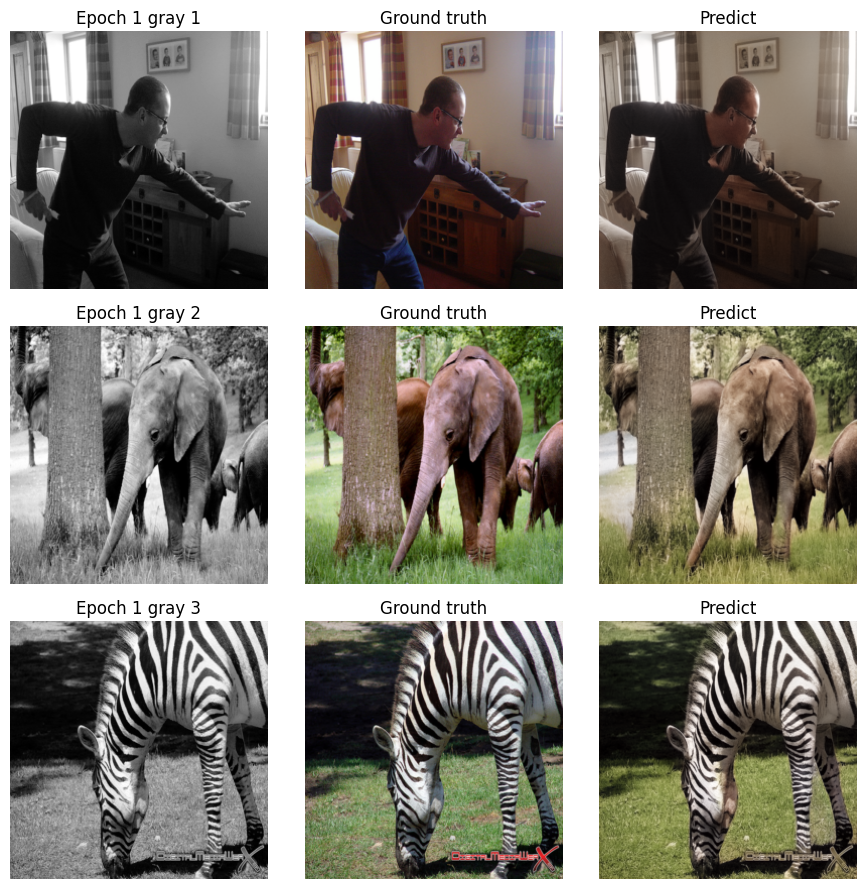

Epoch 001 | train_loss: 0.070586 | val_loss: 0.072219 | lr: 0.000100
Saved best checkpoint at epoch 1 with val_loss 0.072219


Train 2:   0%|          | 0/1878 [00:00<?, ?it/s]

Val 2:   0%|          | 0/209 [00:00<?, ?it/s]

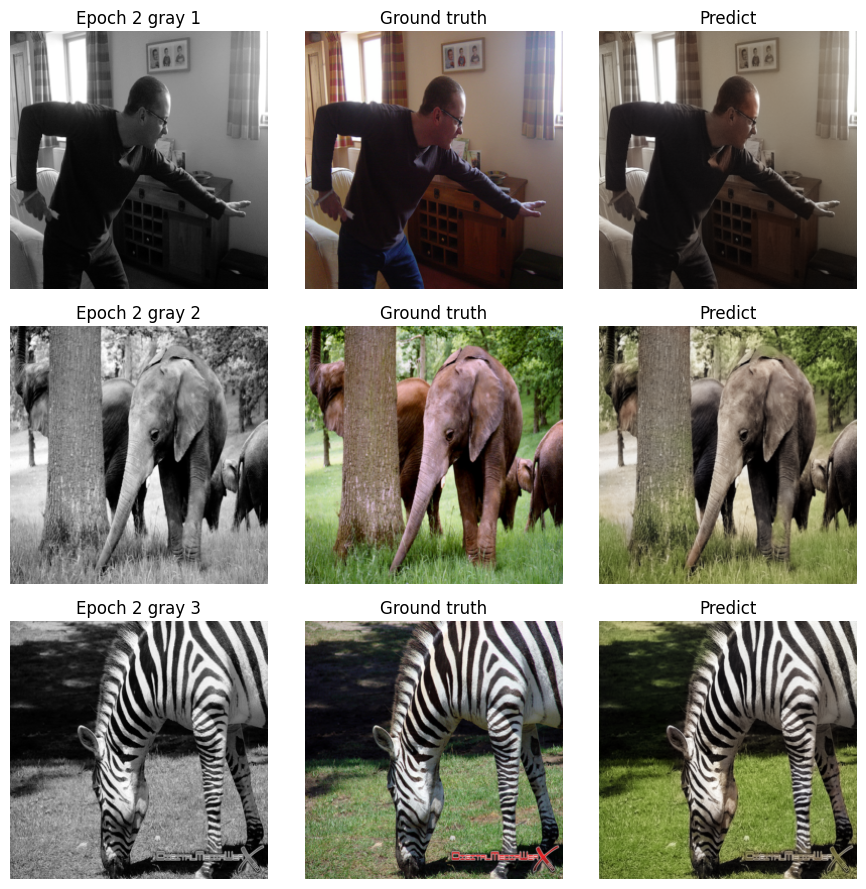

Epoch 002 | train_loss: 0.068894 | val_loss: 0.069517 | lr: 0.000100
Saved best checkpoint at epoch 2 with val_loss 0.069517


Train 3:   0%|          | 0/1878 [00:00<?, ?it/s]

Val 3:   0%|          | 0/209 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Exception ignored in: 
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Traceback (most recent call last):

Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__

  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Exception ignored in:     Exception ignored in: Traceback (most recent call last):

    <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>self._shutdown_workers()self._shutdown_workers()  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Traceback (most recent call last):

<function _MultiProcess

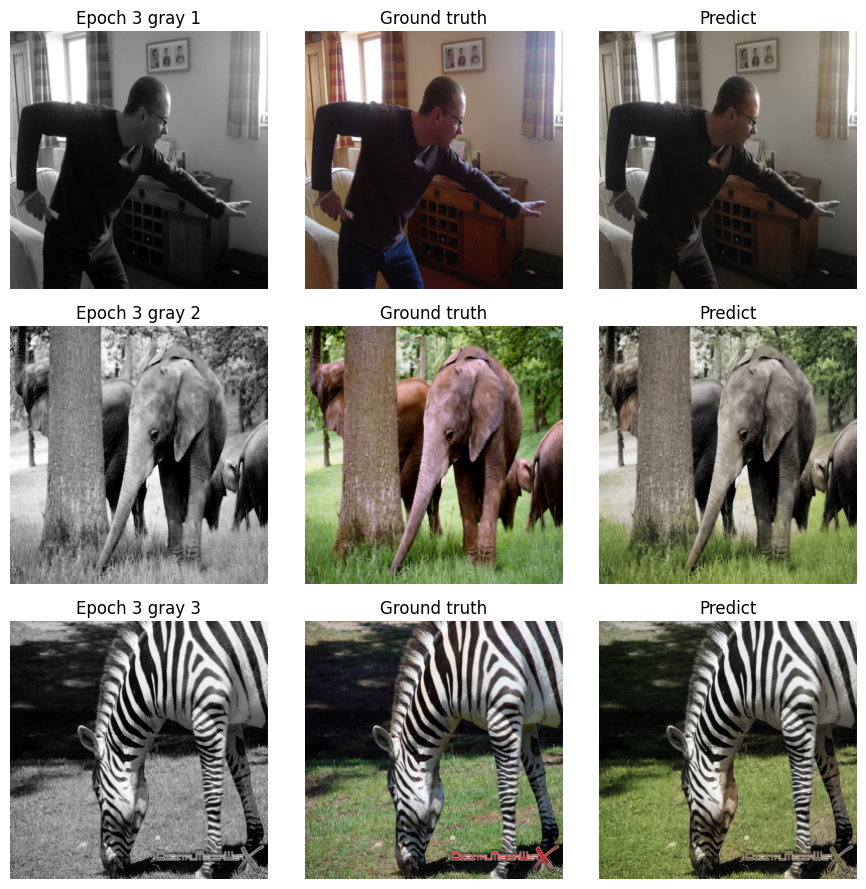

Epoch 003 | train_loss: 0.067535 | val_loss: 0.068863 | lr: 0.000099
Saved best checkpoint at epoch 3 with val_loss 0.068863


Train 4:   0%|          | 0/1878 [00:00<?, ?it/s]

Val 4:   0%|          | 0/209 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>

<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>
Traceback (most recent call last):
Traceback (most recent call last):


Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py"

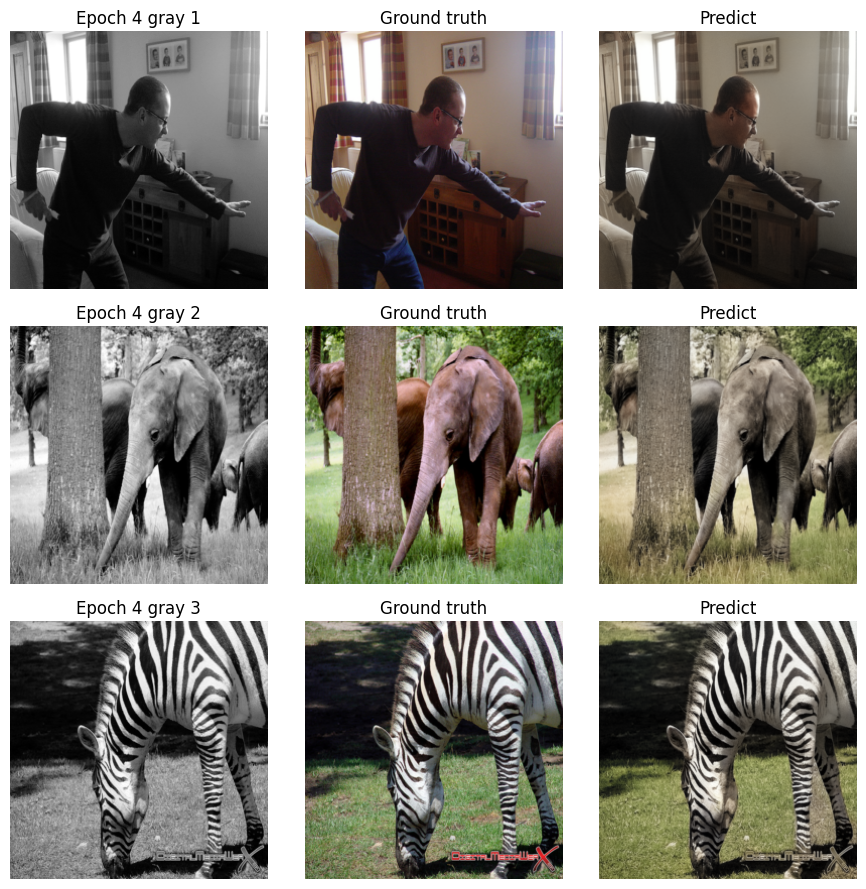

Epoch 004 | train_loss: 0.066286 | val_loss: 0.069016 | lr: 0.000098


Train 5:   0%|          | 0/1878 [00:00<?, ?it/s]

Val 5:   0%|          | 0/209 [00:00<?, ?it/s]

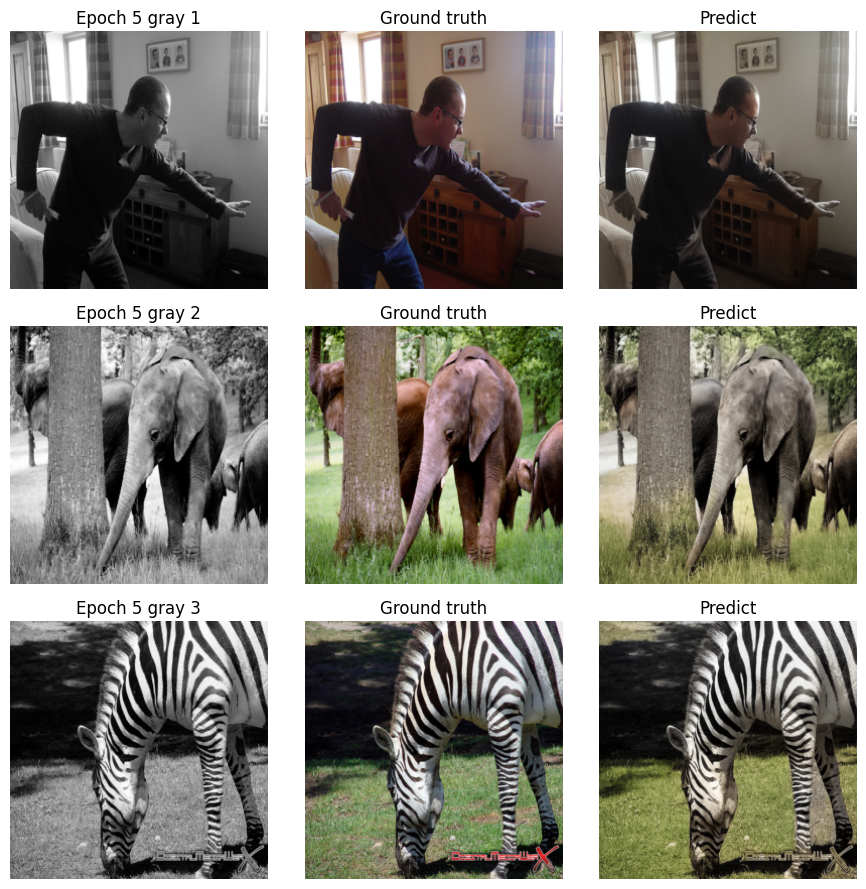

Epoch 005 | train_loss: 0.064908 | val_loss: 0.068469 | lr: 0.000098
Saved best checkpoint at epoch 5 with val_loss 0.068469


Train 6:   0%|          | 0/1878 [00:00<?, ?it/s]

Val 6:   0%|          | 0/209 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>
Traceback (most recent call last):
Exception ignored in:   File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Exception ignored in: Exception ignored in: Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>
    
Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>

Traceback (most recent call last):
Traceback (most recent call last):

  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
self._shutdown_workers()Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/loc

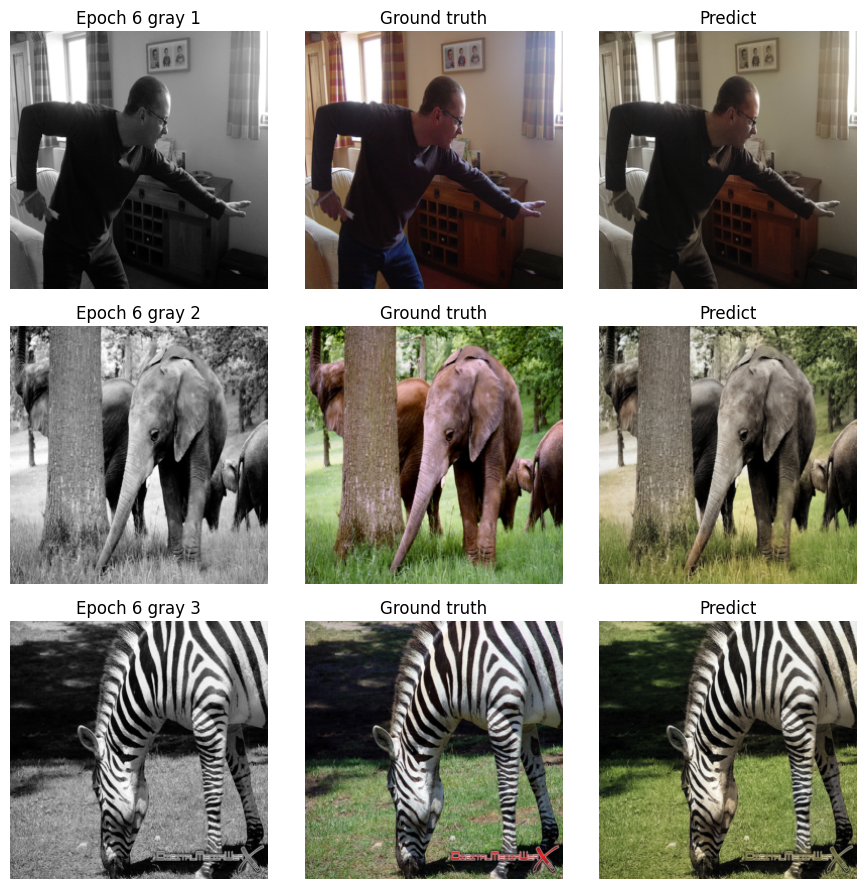

Epoch 006 | train_loss: 0.063449 | val_loss: 0.068568 | lr: 0.000096


Train 7:   0%|          | 0/1878 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__

Traceback (most recent call last):
      File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()
self._shutdown_workers()  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
    
if w.is_alive():  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers

     if w.is_alive():  
       Exception ignored in:   <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>^^ 
 ^Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.

Val 7:   0%|          | 0/209 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: Exception ignored in: Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>


<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>
Traceback (most recent call last):

Traceback (most recent call last):
Traceback (most recent call last):

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py"

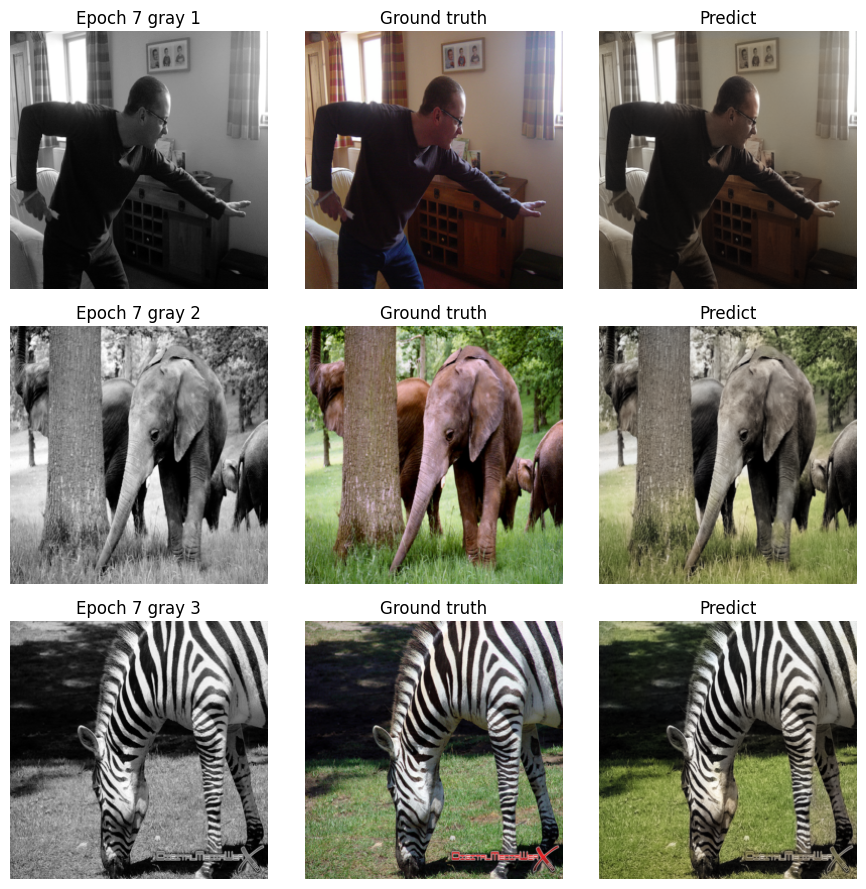

Epoch 007 | train_loss: 0.061771 | val_loss: 0.067861 | lr: 0.000095
Saved best checkpoint at epoch 7 with val_loss 0.067861


Train 8:   0%|          | 0/1878 [00:00<?, ?it/s]

Val 8:   0%|          | 0/209 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Exception ignored in: 
Traceback (most recent call last):

<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Exception ignored in: 
Traceback (most recent call last):

  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Traceback (most recent call last):
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__

Traceback (most recent call last):
      File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader

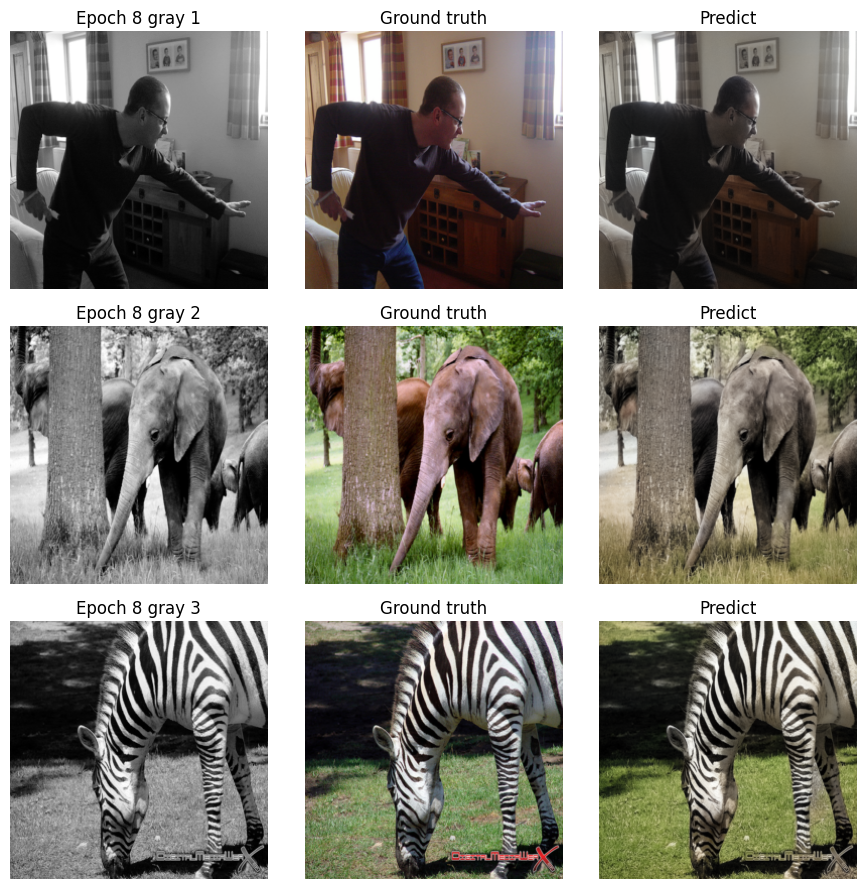

Epoch 008 | train_loss: 0.060135 | val_loss: 0.068455 | lr: 0.000094


Train 9:   0%|          | 0/1878 [00:00<?, ?it/s]

Val 9:   0%|          | 0/209 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>
Exception ignored in: Exception ignored in: Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__

<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>    Traceback (most recent call last):
Traceback (most recent call last):
Exception ignored in:   File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
self._shutdown_workers()
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Traceback (most recent call last):
    self._shutdown_workers()


<function _MultiP

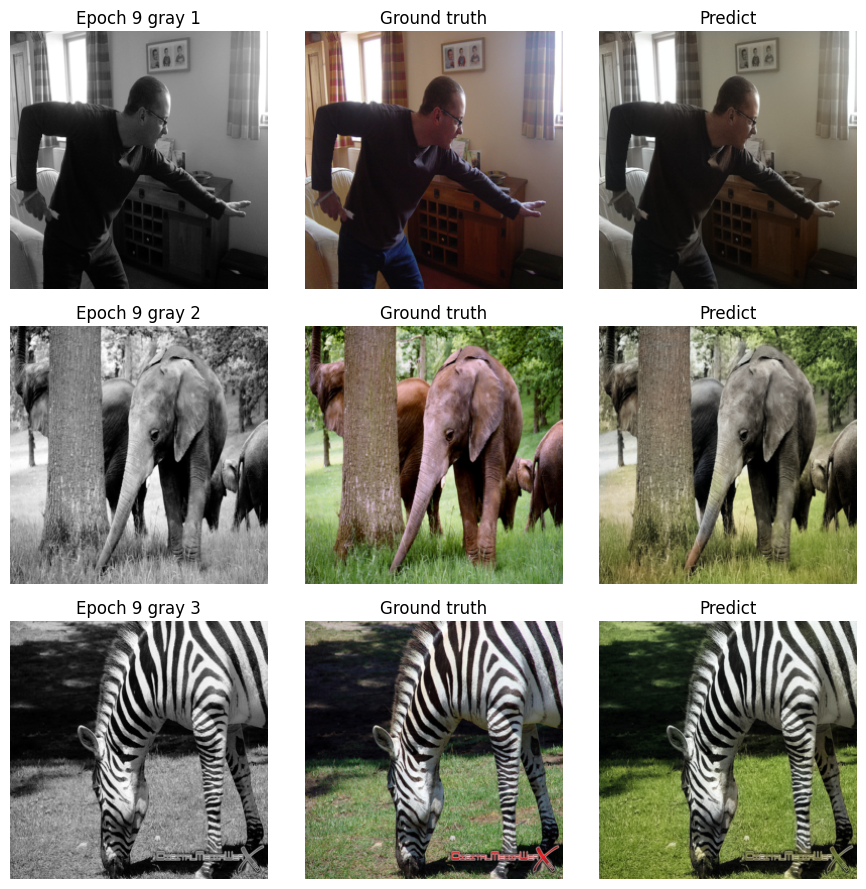

Epoch 009 | train_loss: 0.058391 | val_loss: 0.069525 | lr: 0.000092


Train 10:   0%|          | 0/1878 [00:00<?, ?it/s]

Val 10:   0%|          | 0/209 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>

Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>

Exception ignored in: Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Traceback (most recent call last):

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
  File "/usr

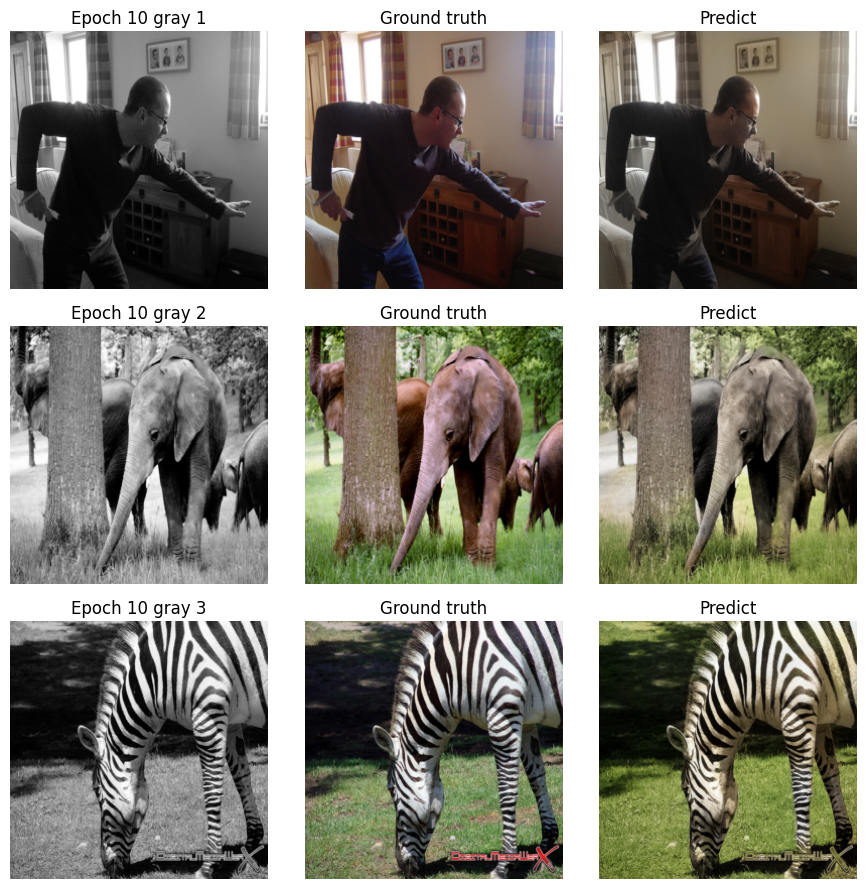

Epoch 010 | train_loss: 0.056793 | val_loss: 0.069660 | lr: 0.000090


Train 11:   0%|          | 0/1878 [00:00<?, ?it/s]

Val 11:   0%|          | 0/209 [00:00<?, ?it/s]

Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Traceback (most recent call last):

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Exception ignored in: Exception ignored in:     <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>    
self._shutdown_workers()Exception ignored in: Exception ignored in: Traceback (most recent call last):
self._shutdown_workers()<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706

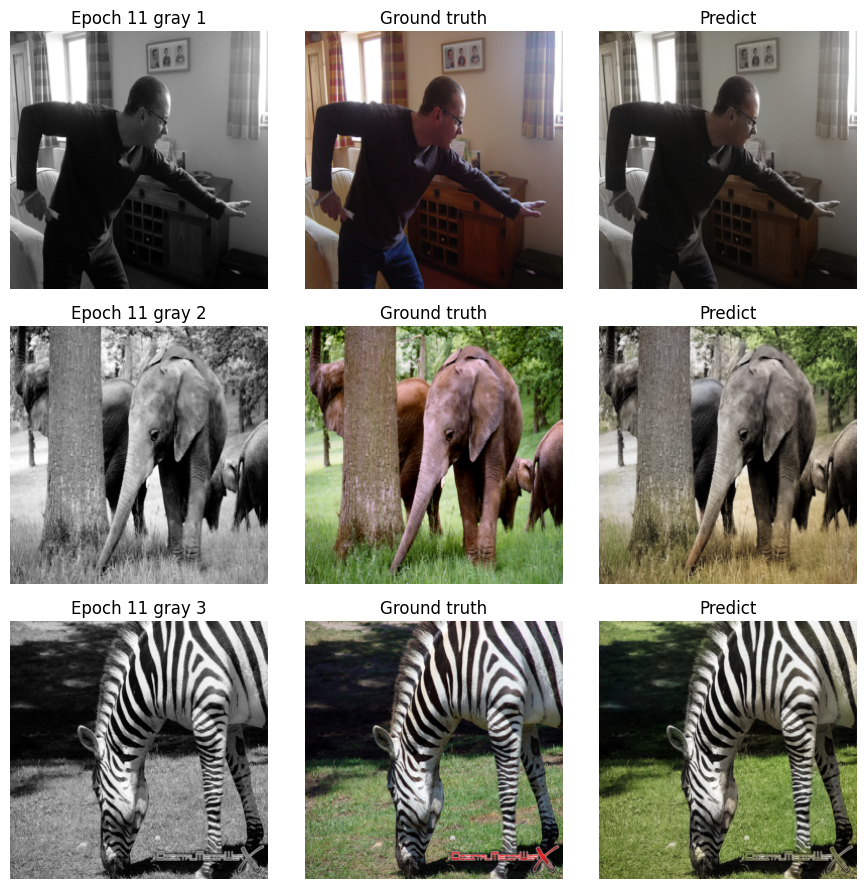

Epoch 011 | train_loss: 0.055227 | val_loss: 0.069057 | lr: 0.000089


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>
Exception ignored in: Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>    <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>self._shutdown_workers()


Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
      File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    self._shutdown_workers()if w.is_alive():
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1601, in _shutdown_workers

        sel

Train 12:   0%|          | 0/1878 [00:02<?, ?it/s]

Val 12:   0%|          | 0/209 [00:00<?, ?it/s]

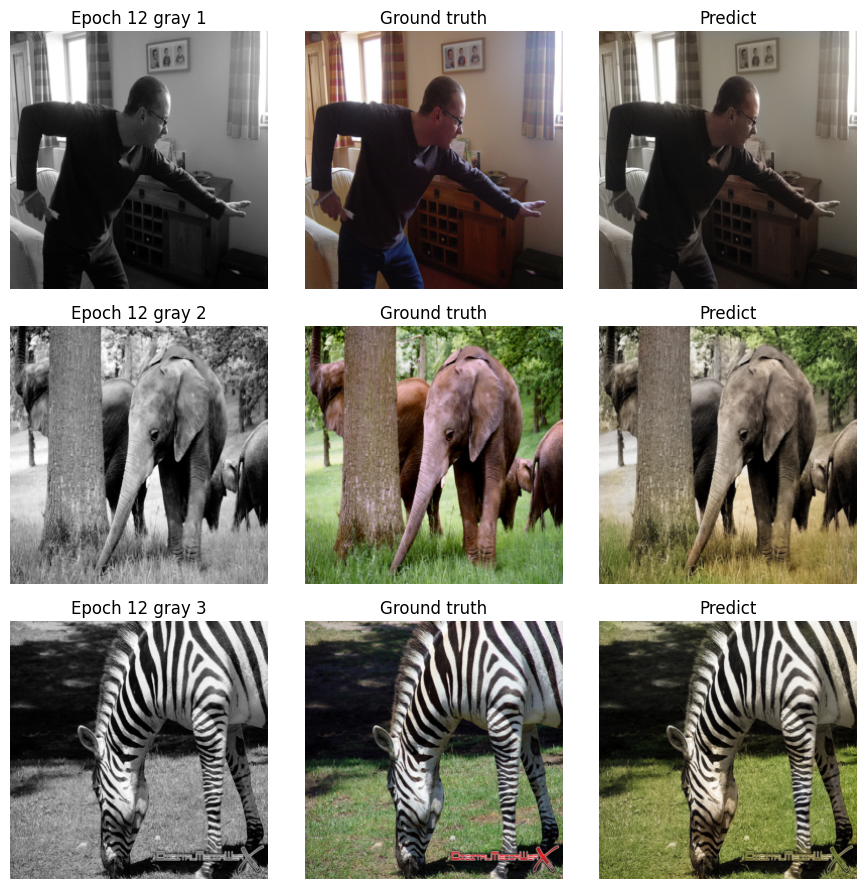

Epoch 012 | train_loss: 0.053666 | val_loss: 0.069145 | lr: 0.000086


Train 13:   0%|          | 0/1878 [00:00<?, ?it/s]

Val 13:   0%|          | 0/209 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: Exception ignored in: Exception ignored in: Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>



<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):


  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Traceback (

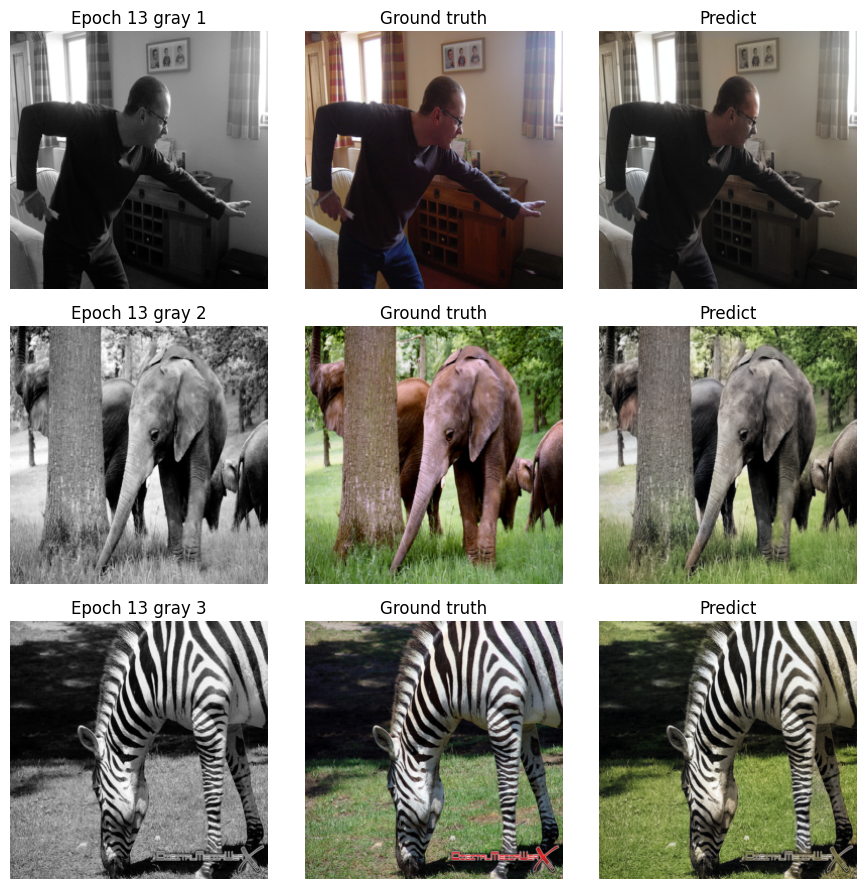

Epoch 013 | train_loss: 0.052199 | val_loss: 0.069769 | lr: 0.000084


Train 14:   0%|          | 0/1878 [00:00<?, ?it/s]

Val 14:   0%|          | 0/209 [00:00<?, ?it/s]

Exception ignored in: Exception ignored in: Exception ignored in: Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980><function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>
Exception ignored in: 
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Traceback (most recent call last):
<function _MultiProcessingDataLoaderIter.__del__ at 0x78706315e980>Traceback (most recent call last):

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__


  File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
Traceback (most recent call last):
      File "/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py", line 1618, in __del__
    Tra

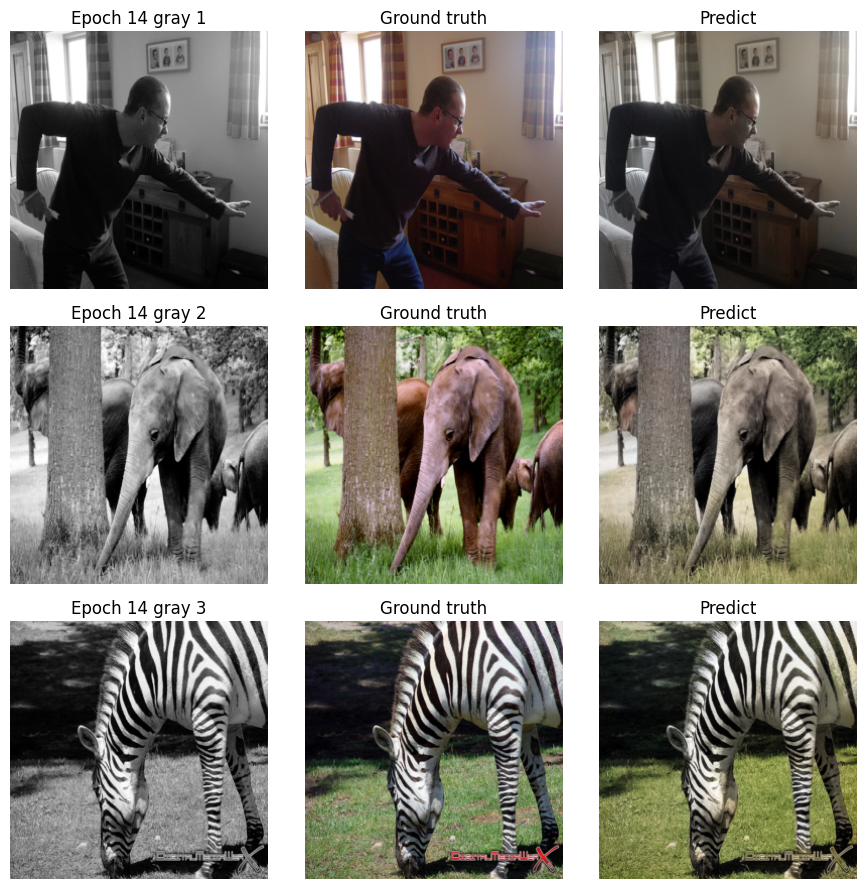

Epoch 014 | train_loss: 0.050853 | val_loss: 0.069549 | lr: 0.000082
Early stopping at epoch 14


In [12]:
criterion = CharbonnierLoss(eps=1e-3, ab_norm=110.0)
optimizer = torch.optim.AdamW(trainable_params, lr=1e-4, weight_decay=1e-4)

num_epochs = 50
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer,
    T_max=num_epochs
)

scaler = GradScaler(enabled=use_amp)
early_stopper = EarlyStopping(patience=7, min_delta=1e-4)

for epoch in range(start_epoch, num_epochs + 1):

    train_loss = train_one_epoch(
        model=model,
        loader=train_loader,
        optimizer=optimizer,
        criterion=criterion,
        device=device,
        epoch=epoch,
        scaler=scaler,
        use_amp=use_amp,
        amp_dtype=amp_dtype,
    )

    val_loss = val_one_epoch(
        model=model,
        loader=val_loader,
        criterion=criterion,
        device=device,
        epoch=epoch,
        use_amp=False,
        amp_dtype=torch.float32,
    )

    scheduler.step()
    lr_now = optimizer.param_groups[0]["lr"]

    print(f"Epoch {epoch:03d} | train_loss: {train_loss:.6f} | val_loss: {val_loss:.6f} | lr: {lr_now:.6f}")

    with open(log_path, "a", newline="") as f:
        csv.writer(f).writerow([epoch, train_loss, val_loss, lr_now])

    improved = early_stopper.step(val_loss)
    if improved:
        best_val_loss = val_loss
        torch.save(
            {
                "epoch": epoch,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "scheduler_state_dict": scheduler.state_dict(),
                "scaler_state_dict": scaler,
                "best_val_loss": best_val_loss,
            },
            checkpoint_path,
        )
        print(f"Saved best checkpoint at epoch {epoch} with val_loss {val_loss:.6f}")

    if early_stopper.should_stop:
        print(f"Early stopping at epoch {epoch}")
        break


In [13]:
import torch
import numpy as np
from skimage.color import lab2rgb
from PIL import Image
import os

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ResNetColorGenerator(pretrained=True)

ckpt = torch.load('/kaggle/working/model/siggraph17_best_checkpoint.pth', map_location=device, weights_only=False)
model.load_state_dict(ckpt["model_state_dict"])

model = model.to(device)


NameError: name 'ResNetColorGenerator' is not defined

In [ ]:
import random
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import lab2rgb
import torch
from torch.amp import autocast

model.eval()

L_batch_cpu, ab_batch = next(iter(train_loader))
B = L_batch_cpu.size(0)
idxs = random.sample(range(B), k=min(50, B))

L_batch = L_batch_cpu.to(device)

with torch.no_grad():
    if use_amp and device.type == "cuda":
        with autocast(device_type="cuda", dtype=amp_dtype):
            pred_ab_batch = model(L_batch)
    else:
        pred_ab_batch = model(L_batch)

pred_ab_batch = torch.clamp(pred_ab_batch, -128, 128).detach().cpu()

for idx in idxs:
    L = L_batch_cpu[idx, 0].numpy()                      # [H,W]
    true_ab = ab_batch[idx].numpy().transpose(1, 2, 0)   # [H,W,2]
    pred_ab = pred_ab_batch[idx].numpy().transpose(1, 2, 0)

    lab_true = np.zeros((L.shape[0], L.shape[1], 3), dtype=np.float32)
    lab_true[:, :, 0] = L
    lab_true[:, :, 1:] = true_ab

    lab_pred = np.zeros_like(lab_true)
    lab_pred[:, :, 0] = L
    lab_pred[:, :, 1:] = pred_ab

    rgb_true = (lab2rgb(lab_true) * 255).astype(np.uint8)
    rgb_pred = (lab2rgb(lab_pred) * 255).astype(np.uint8)
    gray = (L / 100.0 * 255).astype(np.uint8)

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(gray, cmap="gray")
    plt.title("L")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(rgb_true)
    plt.title("GT color")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(rgb_pred)
    plt.title("Pred color")
    plt.axis("off")

    plt.show()
